## Session 2: Spark Programming Model And RDD Concepts

### First Look At Spark:

- Top level Apache project (open-source)
  [http://spark.apache.org/](http://spark.apache.org/)
- Written in Scala
- Runs on the Java Virtual Machine (JVM)
- API support for many languages (Scala, Python, Java, R …)
- Binary tarballs available on the project website
-  Contain Spark/Scala libraries, interactive shells, run scripts
- Optionally with Hadoop distribution (several are supported)
- Can be used in multiple clustering modes
- Standalone: We'll start with this first
- Using external cluster manager
- Hadoop/YARN and Mesos


### System Requirements and Installation:
- Get Spark from the [downloads page](https://spark.apache.org/downloads.html) of the project website.

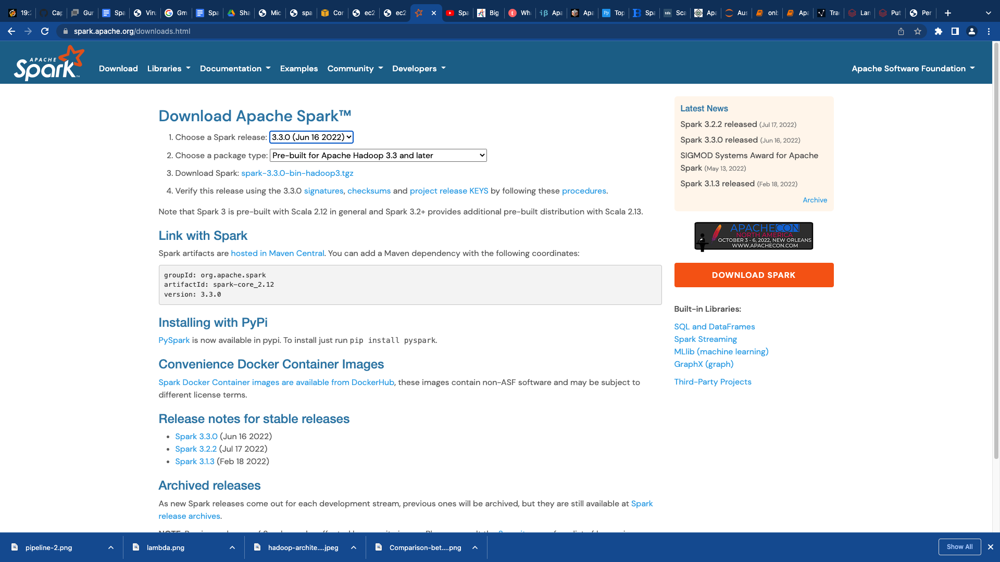

- This documentation is for Spark version 3.3.0. 
- Spark uses Hadoop’s client libraries for HDFS and YARN. Downloads are pre-packaged for a handful of popular Hadoop versions.
- Users can also download a “Hadoop free” binary and run Spark with any Hadoop version by augmenting Spark’s classpath.
- Scala and Java users can include Spark in their projects using its Maven coordinates and Python users can install Spark from PyPI.
- It runs on both WINDOWs and UNIX-like systems (e.g. Linux, Mac OS) with JAVA supported platform.
- You need is to have java installed on your system PATH, or the JAVA_HOME environment .
- It runs on Java 8/11/17, Scala 2.12/2.13, Python 3.7+ and R 3.5+.

## Downloading Steps:
1. Go to download page and choose spark release and package type.
2. Download .tgz file.
3. Verifying Java Installation.
   -  java -version 
4. Extract the .tgz file 
   - tar xvf spark-3.3.0-bin-hadoop3.tgz 
5. Move spark software files to (/usr/local/spark)
   -  su – 
      Password: 
   - cd /Users/Name_users/Downloads/ 
   - mv spark-3.3.0-bin-hadoop3 /usr/local/spark
   - exit
6. Set up the environment for Spark
    - export PATH=$PATH:/usr/local/spark/bin

7. source ~/.bash_profile
8. Verify the Spark Installation
   - cd  /usr/local/spark
   - bin/spark-shell

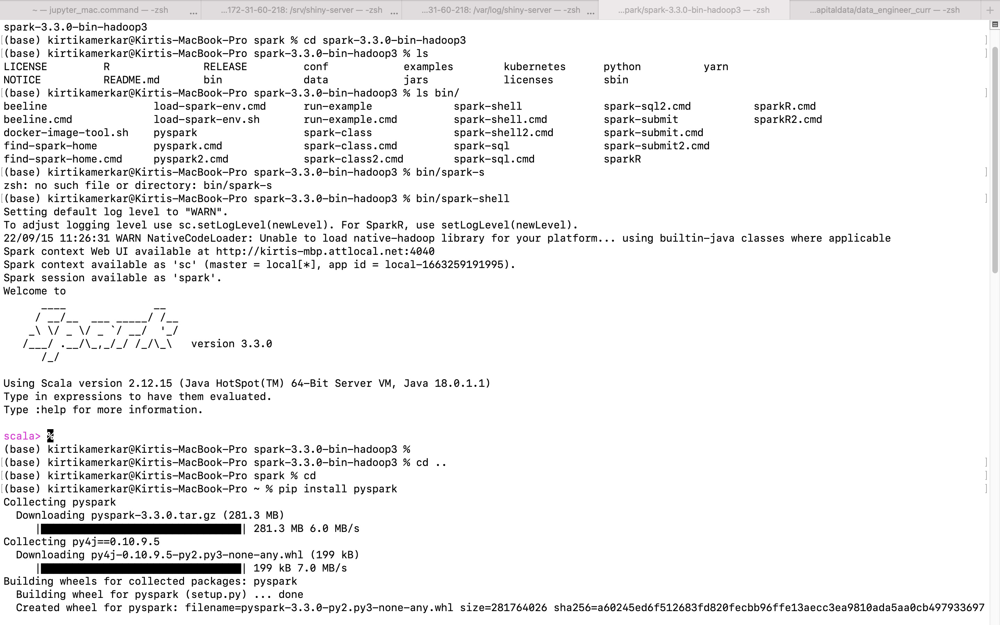

9. Spark has installed.
10. Install pyspark.PySpark is an interface for Apache Spark in Python.
    - Back to home directory and install pyspark.
       - pip install pyspark
11. Starting pyspark Shell (Local Mode)
     - cd  /usr/local/spark
     - bin/pyspark

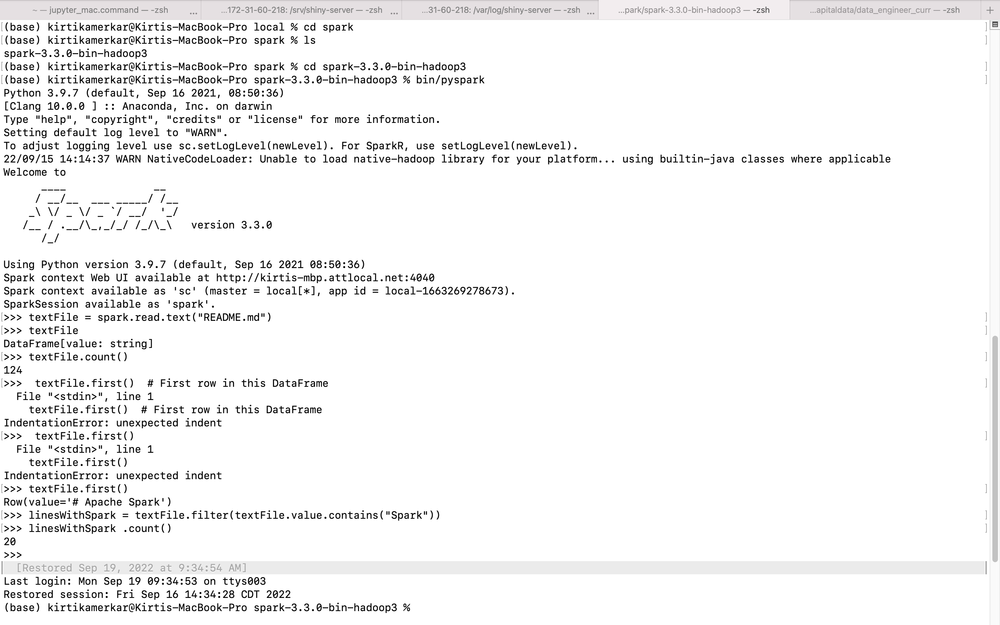

12. Web UI for pyspark / Spark Shell
    - Open  Web UI  url http://kirtis-mbp.attlocal.net:4040

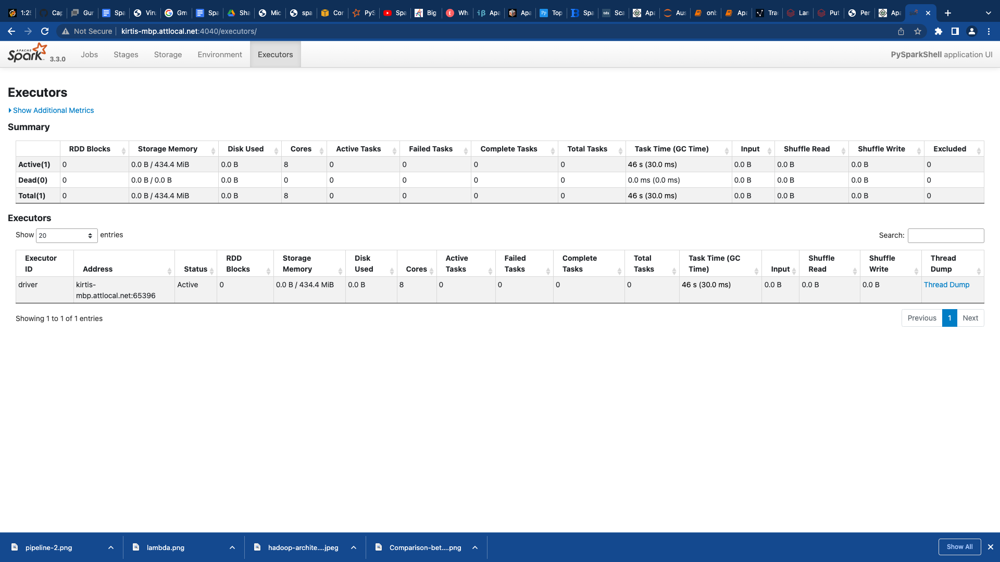

#### Web UI Tabs
- Jobs: Status of all jobs in a Spark application (SparkContext)
    - Either scheduled or already run
    - Can click through to a job detail
- Stages: Current state of all stages of all jobs
    - Plus tasks and statistics for a stage
- Storage: Including RDD size and memory use
- Environment: Spark and system properties, classpath, runtime info
-  Executor: Processing/storage for each executor
   - Can click through to thread dump for an executor
- SQL: Displays SQL query executions
  - Including details of completed queries

#### Spark directories and files:
- Once you have finished downloading and installing spark ,cd to downloaded directories.And take look at the contents:
- README.md
   - This file contains new detailed instructions on how to use Spark shells, build Spark from source, run standalone  Spark examples, peruse links to Spark docu‐ mentation and configuration guides, and contribute to Spark.
- bin
   - This directory, as the name suggests, contains most of the scripts you’ll employ to interact with Spark, including the Spark shells (spark-sql, pyspark, spark- shell, and sparkR).
- sbin
  - Most of the scripts in this directory are administrative in purpose, for starting and stopping Spark components in the cluster in its various deployment modes.
- kubernetes
   - Since the release of Spark 2.4, this directory contains Dockerfiles for creating Docker images for your Spark distribution on a Kubernetes cluster. It also con‐ tains a file providing instructions on how to build the Spark distribution before building your Docker images.
  - This directory, as the name suggests, contains most of the scripts you’ll employ to interact with Spark, including the Spark shells (spark-sql, pyspark, spark- shell, and sparkR). 
- data
  - This directory is populated with *.txt files that serve as input for Spark’s compo‐ nents: MLlib, Structured Streaming, and GraphX
- examples
  - For any developer, two imperatives that ease the journey to learning any new platform are loads of “how-to” code examples and comprehensive documentation. Spark provides examples for Java, Python, R, and Scala, and you’ll want to employ them when learning the framework.   

### Installing Spark Standalone to a Cluster:
- To install Spark Standalone mode, you simply place a compiled version of Spark on each node on the cluster.
- Starting a Cluster Manually:
   1. Start a standalone master server by executing:

       ./sbin/start-master.sh
       
     2. Once started, the master will print out a spark://HOST:PORT URL for itself, which you can use to connect workers to it, or pass as the “master” argument to SparkContext. You can also find this URL on the master’s web UI, which is http://localhost:8080 by default.
     3. Start a standalone workers by executing :
        ./sbin/start-worker.sh <master-spark-URL>
     4.Here <master-spark-URL>=spark://Kirtis-MBP.attlocal.net:7077
        - As the command progresses, it prints out starting org.apache.spark.deploy.worker.Worker, logging to for each worker. You defined two workers in conf/spark-env.sh using SPARK_WORKER_INSTANCES, so you should see two lines. 
     5.Following figure shows master and worker has started.

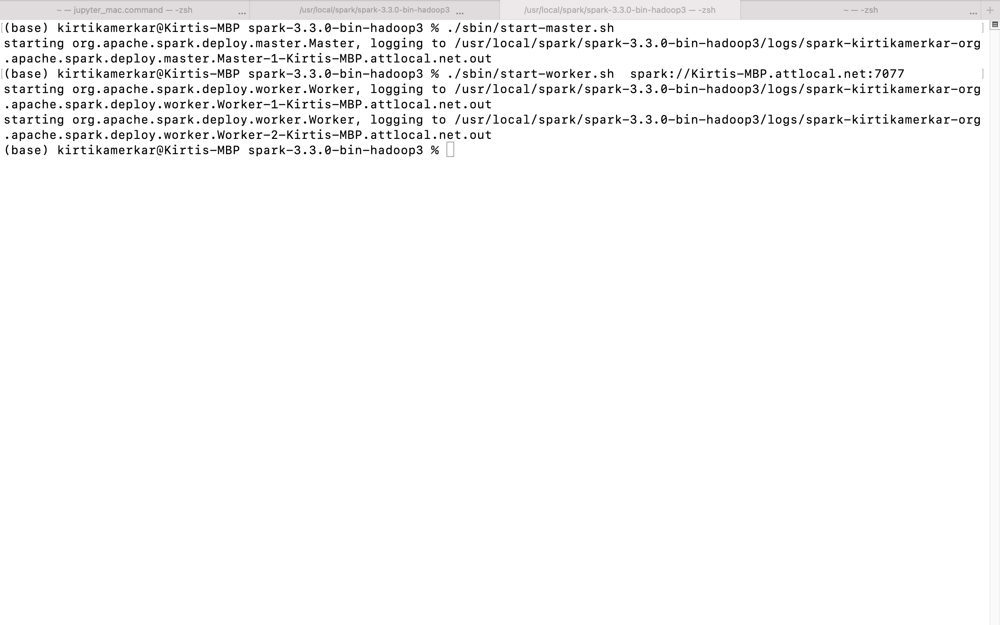

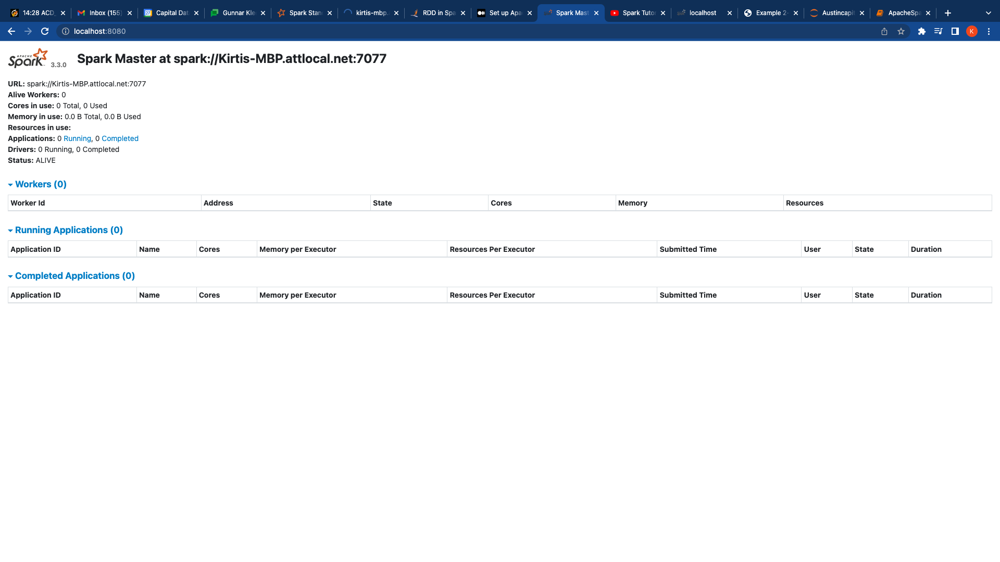

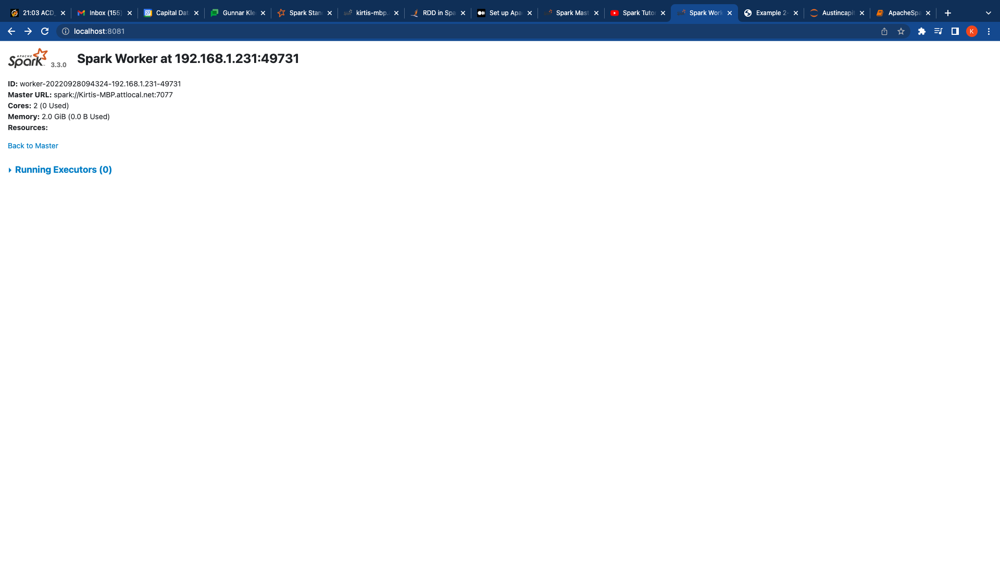

6. The above figure shows two workers started.To start two workers or more standalone worker you need to edit spark-env.sh shell script which is present in /conf folder in spark home.
7. Configuring cluster using conf/spark-env.sh
   There’s the conf/spark-env.sh.template template to start from.

    We’re going to use the following conf/spark-env.sh:

      - conf/spark-env.sh
      - SPARK_WORKER_CORES=2 
      - SPARK_WORKER_INSTANCES=2 
      - SPARK_WORKER_MEMORY=2g
8. Following figure shows master with two workers.

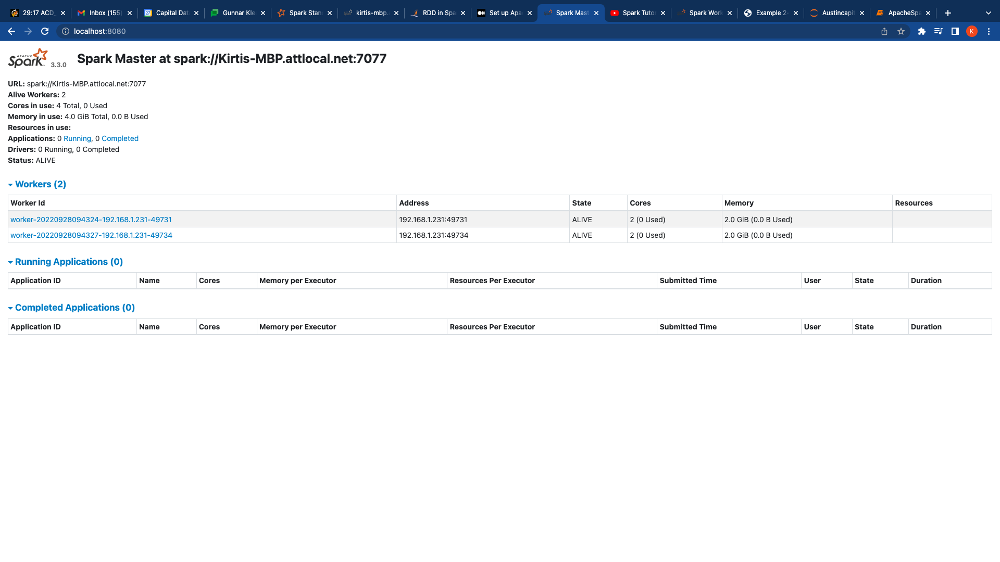

9. Use jps on master to see the instances given they all run on the same machine, e.g. localhost).
  - (base) kirtikamerkar@Kirtis-MBP spark-3.3.0-bin-hadoop3 % jps
  - 1281 Master
  - 1342 Worker
  - 1358 Worker
  - 1486 Jps
10. Stop all instances - the driver and the workers.
  - ./sbin/stop-all.sh

### Connecting an Application to the Cluster:
- To run an application on the Spark cluster, simply pass the spark://IP:PORT URL of the master as to the SparkContext constructor.
- To run an interactive PySpark shell against the cluster, run the following command:
  - ./bin/spark-shell --master spark://IP:PORT

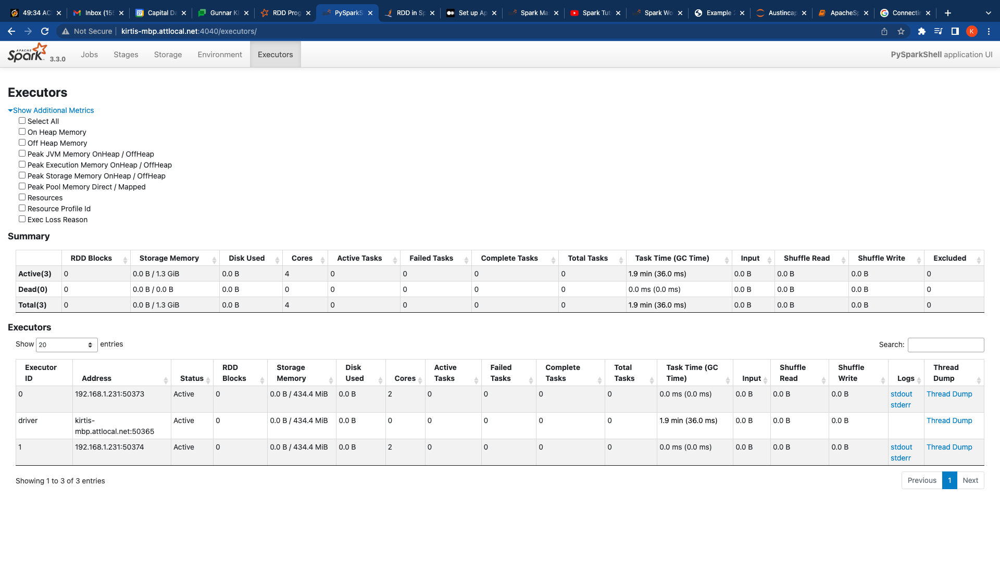

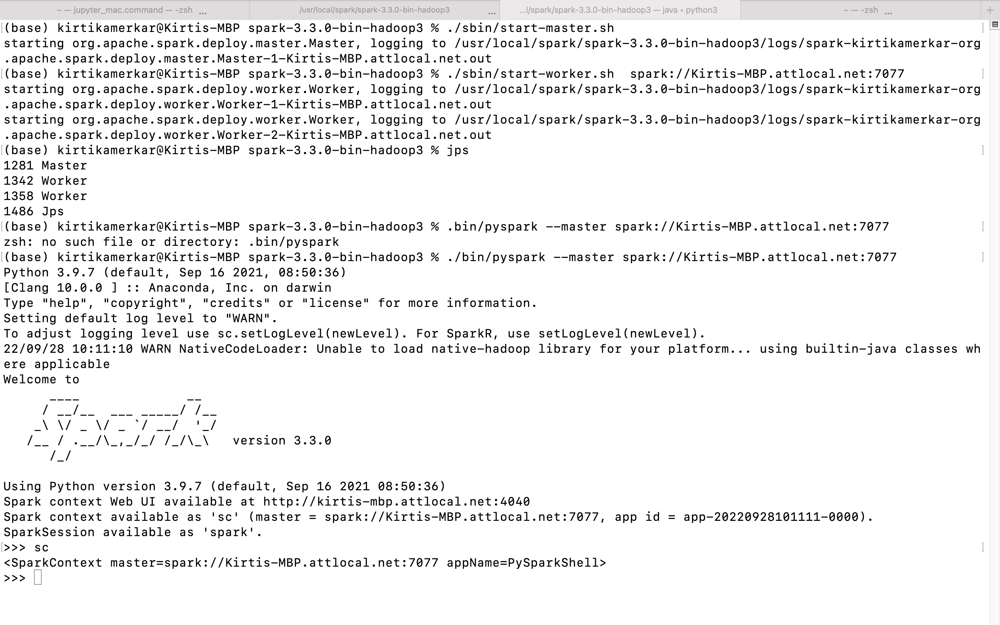

### How to write program / application in Spark?
- Every Spark application is made-up of a Driver program which runs the primary function and is responsible for various parallel operations on the given cluster. 
- The primary abstraction the Spark is the concept of RDD, which Spark uses to achieve Faster and efficient MapReduce operations.
-  There are 3 main data structures in Spark:
1. RDDs(Resilient Distributed Dataset)
2. Dataframes
3. Datasets
- These data structures in Spark help to store the extracted data until it is loaded into a data source after processing.
- Everything in Spark is an RDD. Dataframes and Datasets are also abstractions of RDD.


### Interactive Analysis with the Spark Shell

- Step 1. Start spark-shell by running the following in the Spark directory:
      - ./bin/pyspark
   Or if PySpark is installed with pip in your current environment:
      - pyspark
- Step 2. Abstraction of data/ loading Data: 
      - Spark’s primary abstraction is a distributed collection of items called a Dataset.
      - Datasets can be created from Hadoop InputFormats (such as HDFS files) or by transforming other Datasets.
      - logFile = "/usr/local/spark/spark-3.3.0-bin-hadoop3/README.md" 
      - logData = spark.read.text(logFile)
- Step 3.Perform Dataset Operations :
      - filter()
      - count()
      - collect(),etc
- Step 4.Caching:
       - pulling data sets into a cluster-wide in-memory cache.
       - It is very useful when data is accessed repeatedly, such as when querying a small “hot” dataset or when running an iterative algorithm like PageRank. 

In [ ]:
install_requires=[
        'pyspark==3.3.0'
    ]

In [ ]:
#Spark Application to count lines with 'a' and 'b'
#Step1: import package SparkSession from pyspark.sql
from pyspark.sql import SparkSession

logFile = "/usr/local/spark/spark-3.3.0-bin-hadoop3/README.md"  # Should be some file on your system
spark = SparkSession.builder.appName("SimpleApp").getOrCreate()
logData = spark.read.text(logFile).cache() #caching operation

numAs = logData.filter(logData.value.contains('a')).count()  #operations on dataset
numBs = logData.filter(logData.value.contains('b')).count()

print("Lines with a: %i, lines with b: %i" % (numAs, numBs))

spark.stop()

#### Runtime Architecture of Apache Spark:

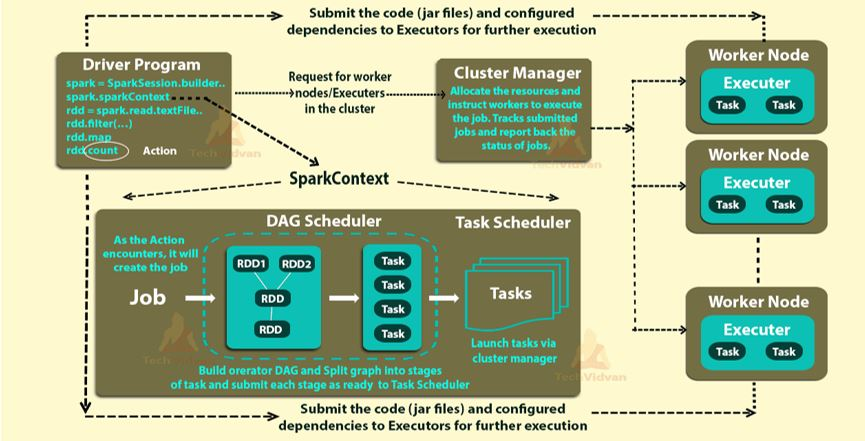

- Depending on the environment Spark is running in, the cluster manager managing this cluster of servers will be either Spark’s standalone cluster manager, Kubernetes, Hadoop YARN, or Mesos. 
- When the Spark cluster is running, you can submit Spark applications to the cluster manager, which will grant resources to your application so that you can complete your data analysis.
- Your cluster may have one, tens, hundreds, or even thousands of worker nodes, depending on the needs of your business and your project requirements.
- You can run Spark on a standalone server such as a MacBook, Linux, or Windows PC, but typically for production environments Spark is run on cluster of Linux servers. 
- To run a Spark program, you need to have access to a Spark cluster and have a driver program, which declares the transformations and actions on RDDs of data and submits such requests to the cluster manager.
- When you start a PySpark shell (by executing /bin/pyspark), you automatically get two  variables/objects defined:
      1. spark
         An instance of SparkSession, which is ideal for creating DataFrames
      2. sc 
         An instance of SparkContext, which is ideal for creating RDDs
- If you write a self-contained PySpark application (a Python driver, which uses the PySpark API), then you have to explicitly create an instance of SparkSession yourself. A SparkSession can be used to:
     - Create DataFrames
     - Register DataFrames as tables
     - Execute SQL over tables and cache tables
     - Read/write text, CSV, JSON, Parquet, and other file formats
     - Read/write relational database tables


### Spinning Apache spark 2.3.1 on EC2 instance using AlmaLinux:
- Create instance for almalinux location:aws-marketplace/AlmaLinux OS 8.6.20220901 x86_64-c076b20a-2305-4771-823f-944909847a05(It's free tier instance)
- Navigate to Roles in the left side menu, and then select Create role. This starts a wizard workflow to create a new role.
  1. Select AWS services and EC2 and click next.
  2. Add permission policies as AdministrationAccess
  3. Give valid name to role and create role.


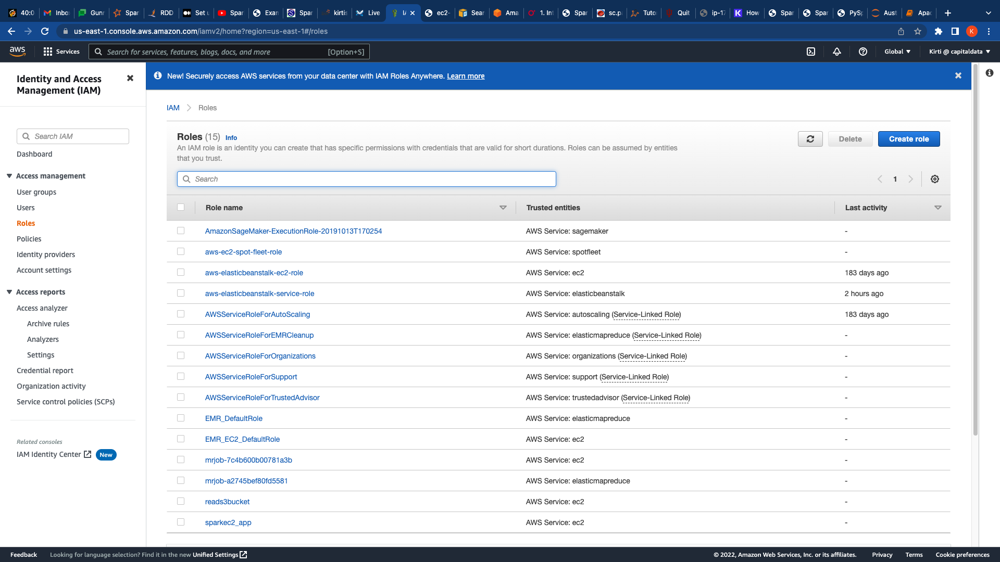

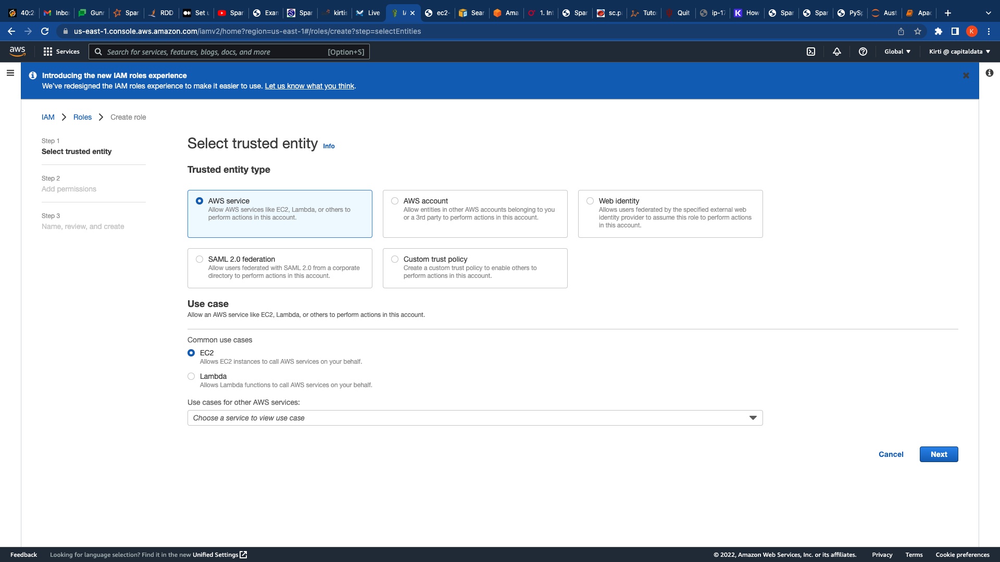

- Naviagate to security and create security group.
  1. Go to instance summary and click on Security.
  2. click on Security group option and click on link below to edit inbound rules.
  3. Add new inbound rules using Custom TCP to 8080-8081 for master and slave webUI and Custom TCP 4040 for spark WebUI.  

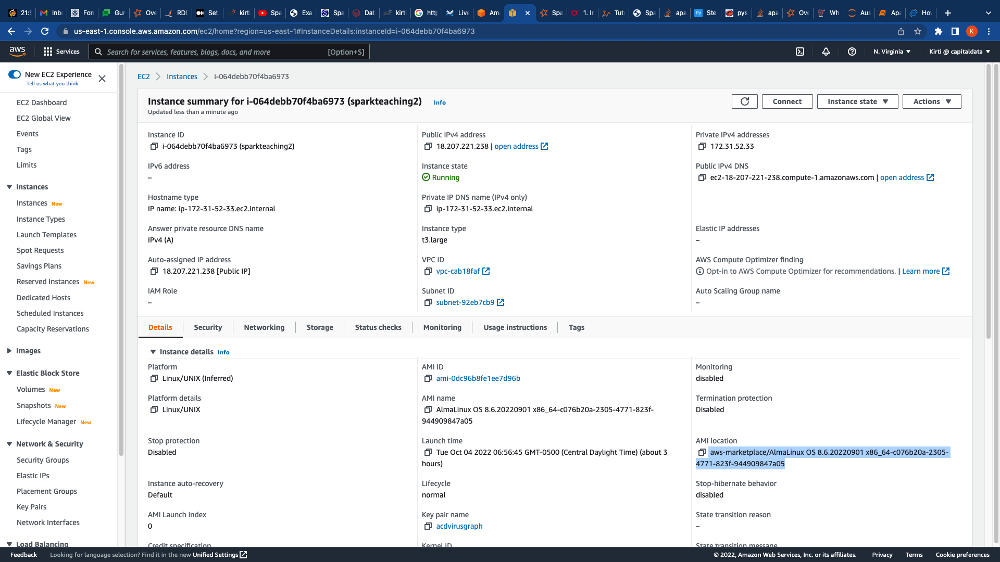

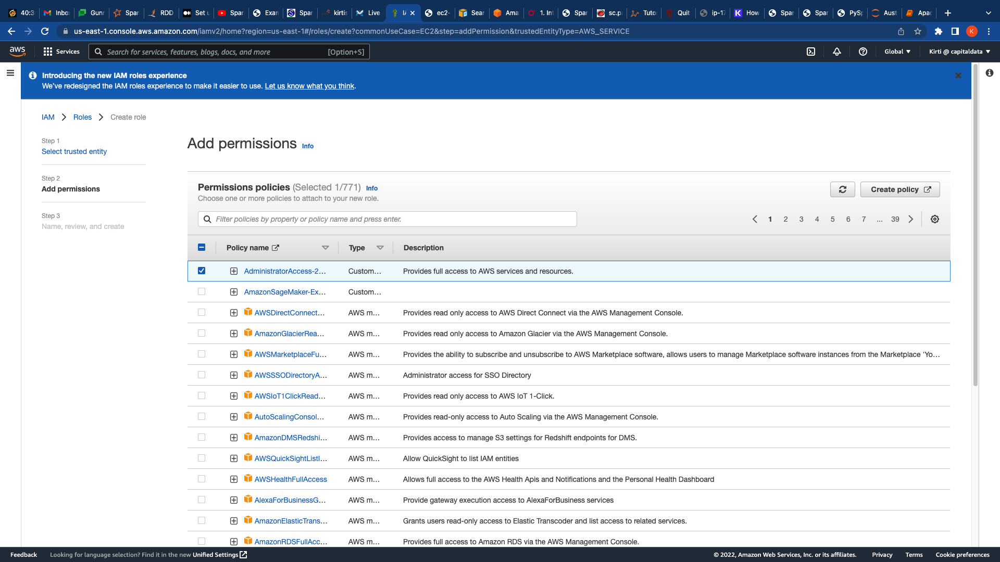

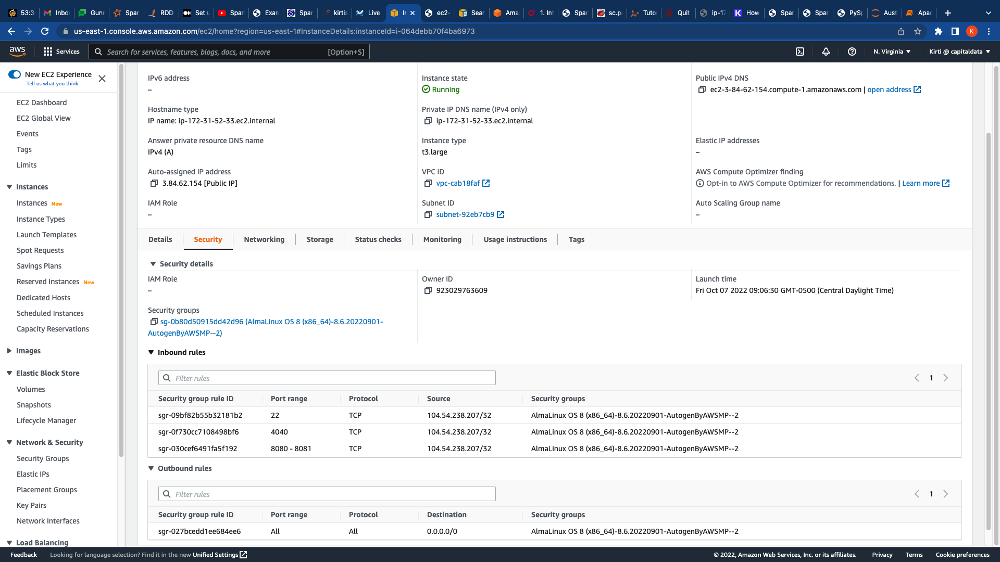

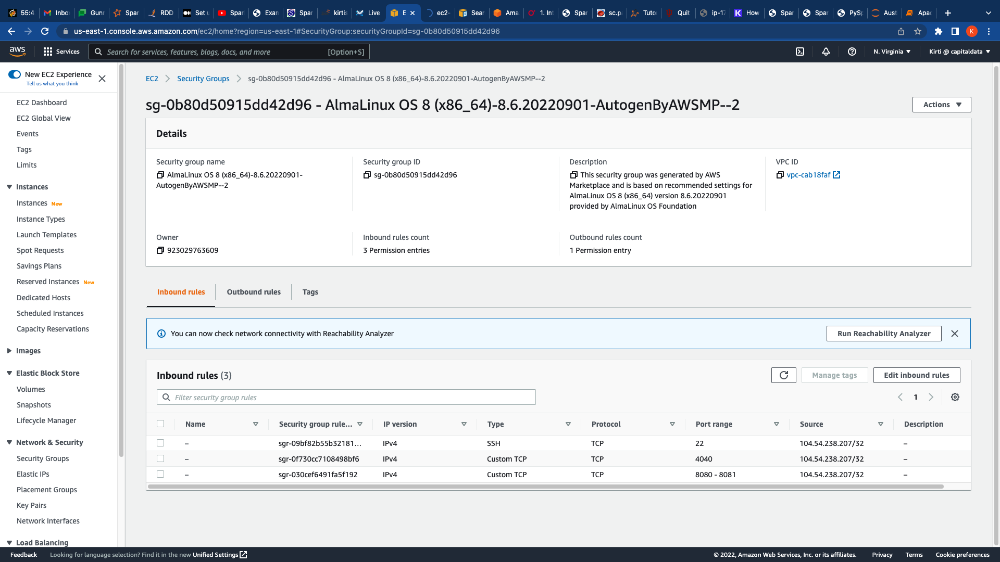

- Connect instance give you four options:
   1. EC2 instance connect
   2. Session manager
   3. SSH client
   4. EC2 serial console
- Use any one of them.We used SSH client.
   - Open an ssh client on terminal window.Land on /.ssh
   - Use this command ssh -i "acdvirusgraph.pem"(your key pair .pem) ec2-user@ec2-18-207-221-238.compute-1.amazonaws.com(yuor public DNS)
   - Start ec2 server.
- Install required softwares on server.To install the packages it will use "yum" package install manager for Almalinux
- By update and upgrading the server you will get the latest packages and versions to install in the server.
  - sudo yum  update
- Apache spark 2.3.1 installation :
  - Apache 2.3.1 is Archived release version.so that first download it on your system then copy the .tgz to ec2 server    using : .ssh % sudo scp -i acdvirusgraph.pem -r /Users/kirtikamerkar/Downloads/spark-2.3.1-bin-hadoop2.7 ec2-user@ec2-18-207-221-238.compute-1.amazonaws.com: 
  - Once directory is copied to EC2 server then install it.To install this version,you need is to have java installed on your system PATH, or the JAVA_HOME environment variable pointing to a Java installation.
  - Java 8+, Python 2.7+/3.4+ and R 3.1+. For the Scala API, Spark 2.3.1 uses Scala 2.11.
  - Note that support for Java 7, Python 2.6 and old Hadoop versions before 2.6.5 were removed as of Spark 2.2.0. Support for Scala 2.10 was removed as of 2.3.0.
  - Install java using: sudo yum install java-1.8.0-openjdky

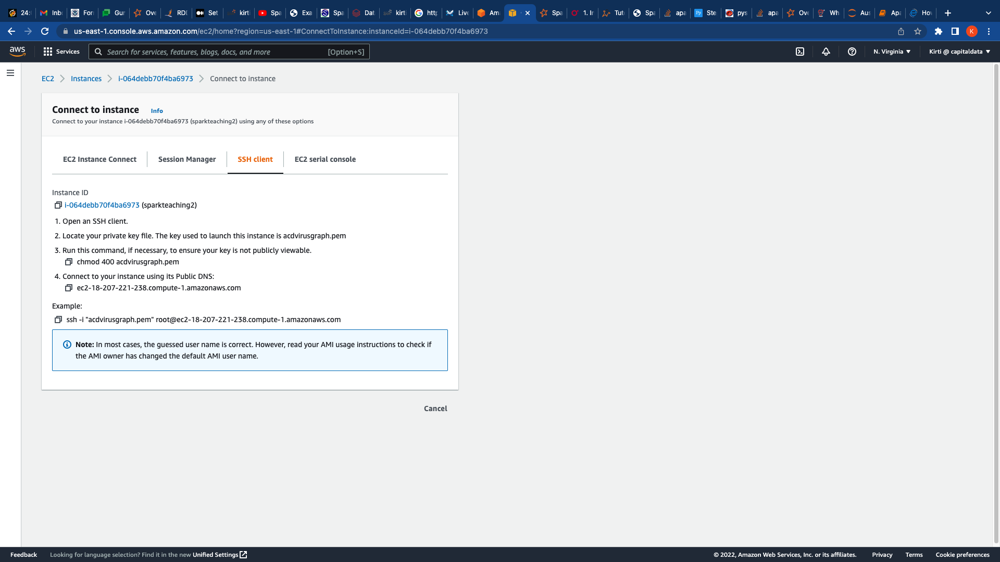

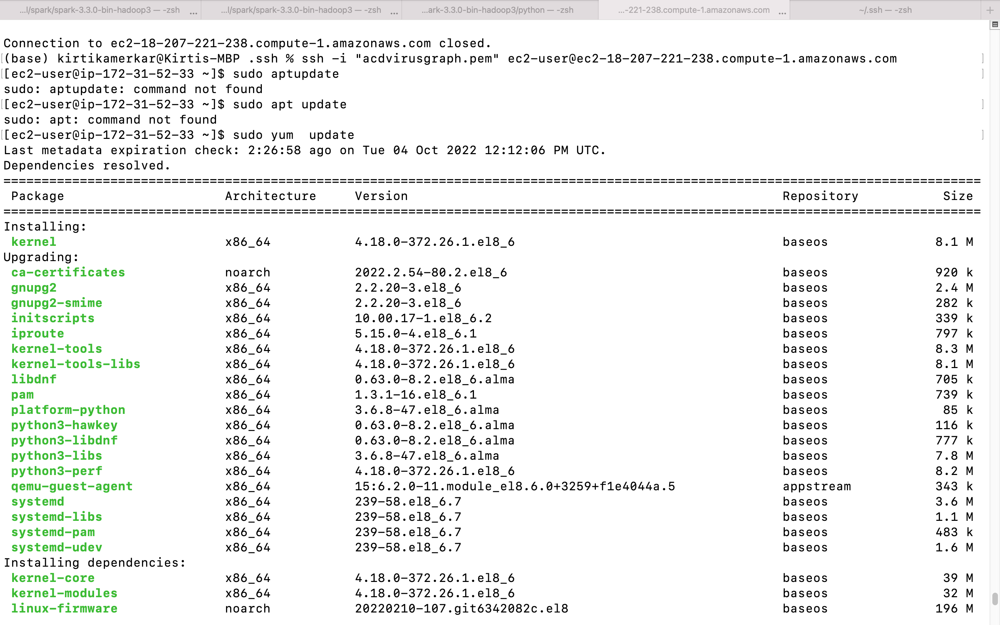

#### Spark Error: pyspark: line 45: python: command not found
- I installed Spark 2.3.1 and on running the the ./pyspark from the bin directory of Spark 2.3.1 this error is coming.
- This error is coming because un availability of python on the machine. So, if don't have python and you are trying to run the pyspark then you will get following error:

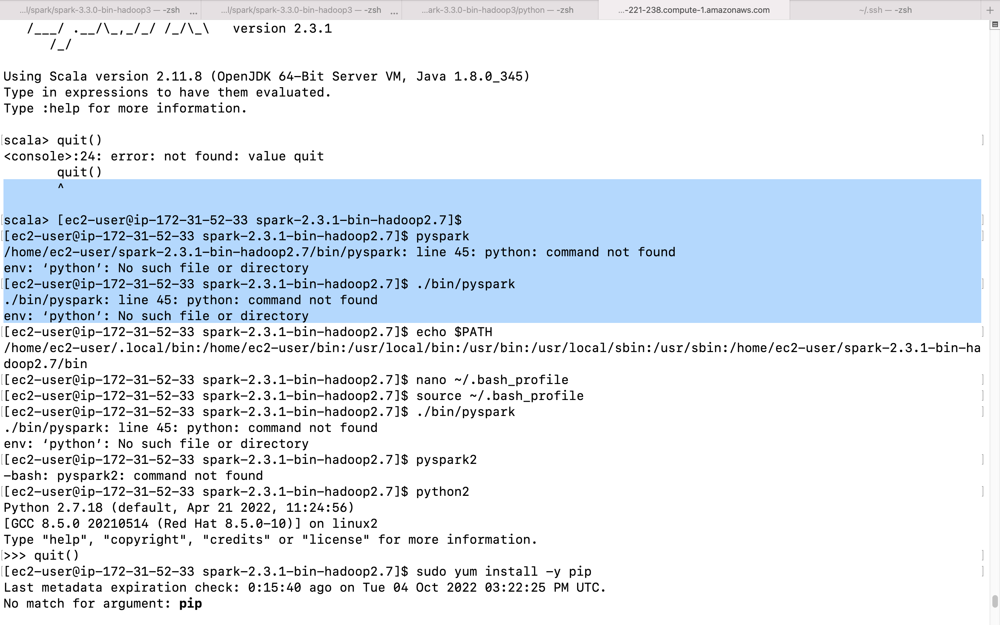

- In order to fix this error we have to install Python 3.5 or above on the machine.
- Install Python3.5+ and edit .bash_profile
   - alias python=python3
   - export PYTHONPATH=$SPARK_HOME/python:$SPARK_HOME/python/lib/py4j-0.10.7-src.zip:$PYTHONPATH
   -  export PYSPARK_PYTHON=python3

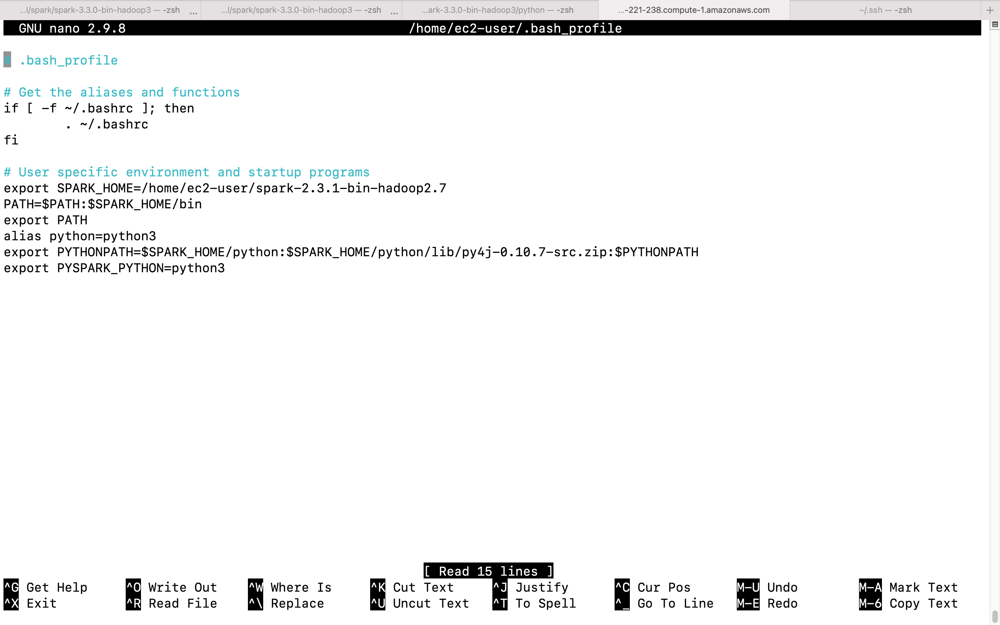

- source /.bash_profile
- Start pyspark using ./bin/pyspark 

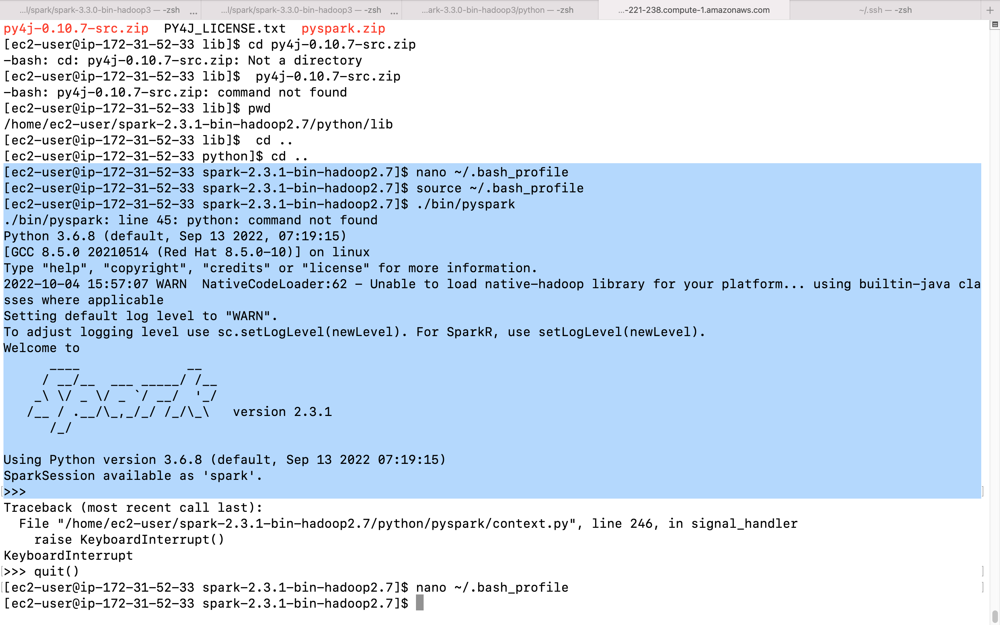

### Managing a Spark Cluster with the spark-ec2 Script

1. Login to your EC2 instance. Run these commands to start a Standalone master.
  -   ./sbin/stop-master.sh
2. The output of this command identifies a log file location. Open this log file in your favourite text editor.
  -  vi /home/ec2-user/spark-2.3.1-bin-hadoop2.7/logs/spark-ec2-user-org.apache.spark.deploy.master.Master-1-ip-172-31-52-33.ec2.internal.out
3. Start slave with master URL which register slave with it's master.You will master url either opening log or opening master webUI i,e.http://[public DNS]:8080

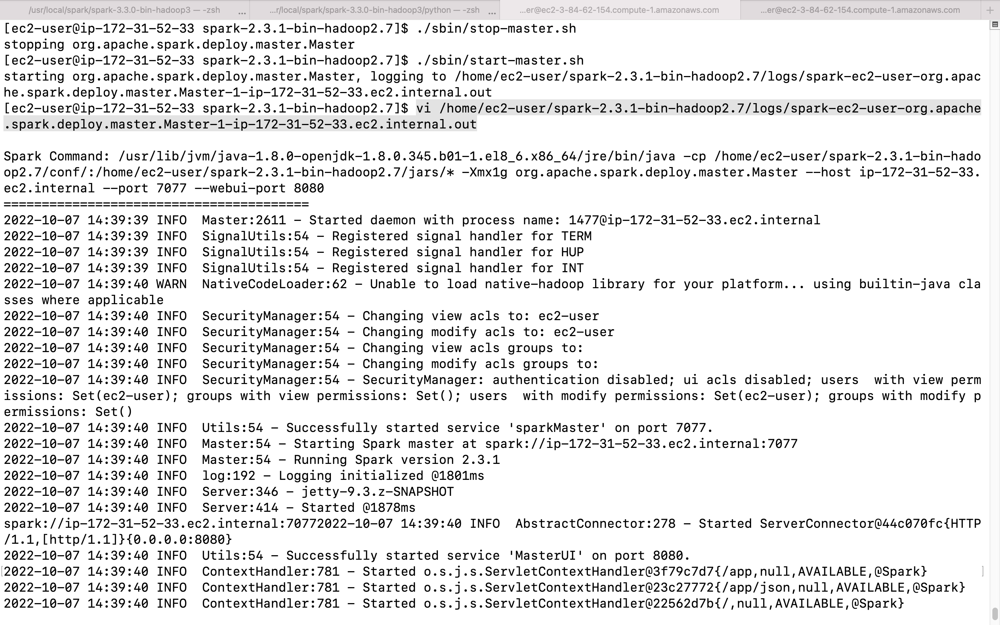

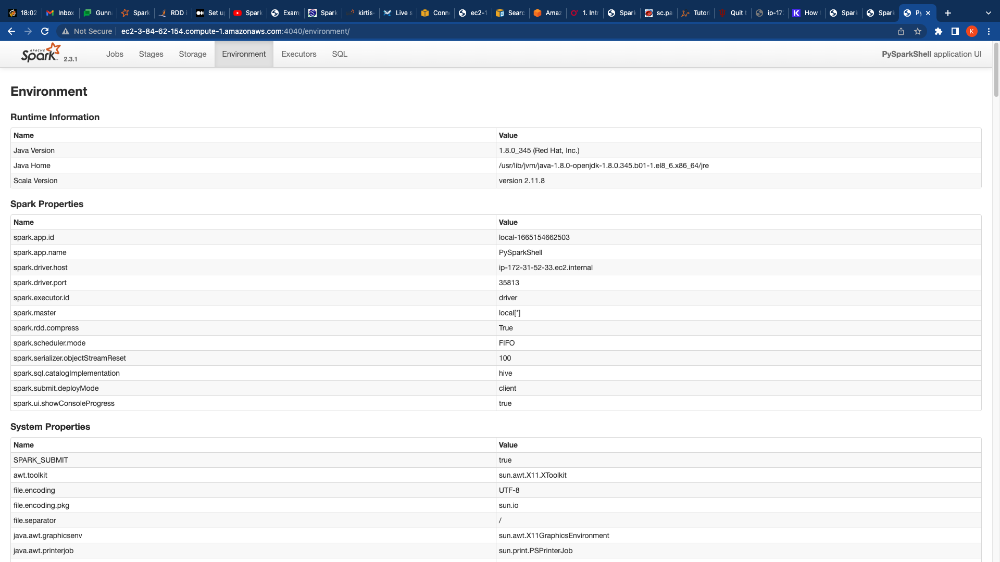

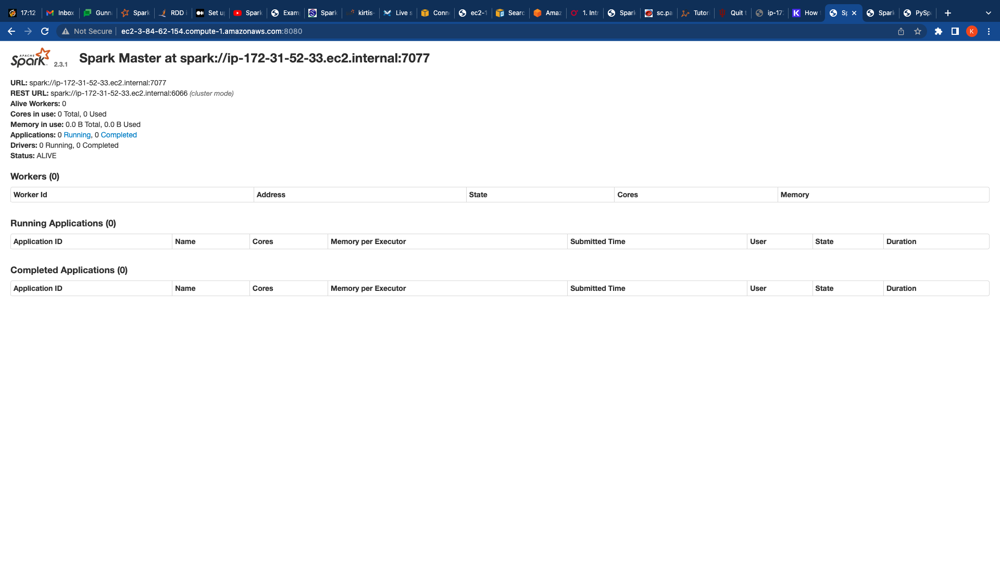

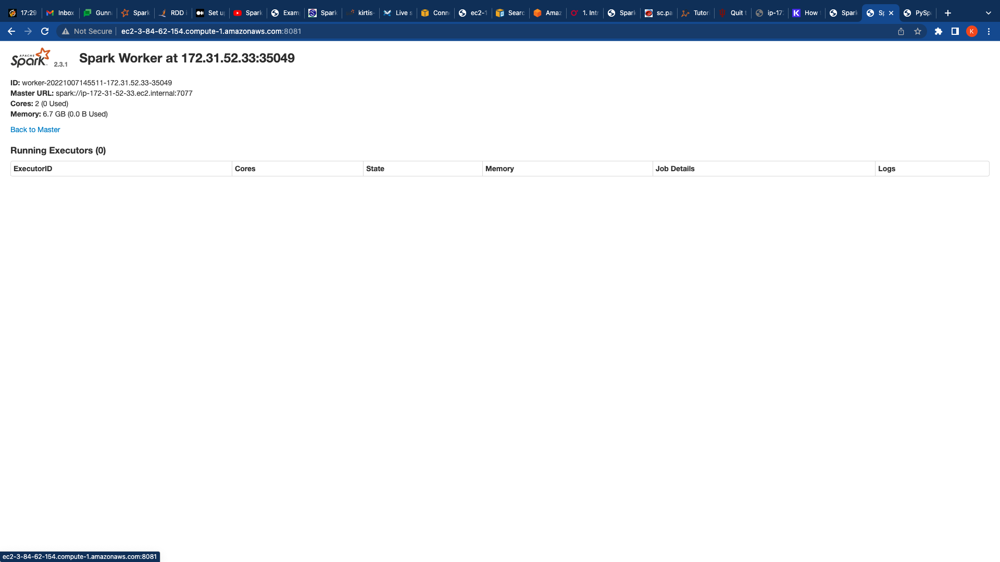

### RDD(Resilient Distributed Dataset):
   - The RDD is the most basic abstraction in spark.There are three vital characteristics associated with RDD:
      - Dependencies: Instructs Spark how an RDD is constructed with its inputs is required. 
      - Partitions: The ability to split the work to parallelize computa‐ tion on partitions across executors
      - Compute functions:Partition => Iterator:Produces an Iterator[T] for the data that will be stored in the RDD
   - Resilient : Fault tolerant and is capable of rebuilding data on failure
   - Distributed : Distributed data among the multiple nodes in a cluster
   - Dataset : Collection of partitioned data with values
   - The fundamental data structure of Spark.
   - Resilient means **Fault-tolerant**,it resides resilient records of data on multiple nodes.
   - Spark gets the data file, splits it into small chunks of data, and distributes those chunks of data across the cluster. This collection of data is referred to as RDDs.
   - Immutable (read-only) in nature. You cannot change an original RDD, but you can create new RDDs by performing coarse-grain operations, like transformations, on an existing RDD.
   -  A single RDD can be divided into multiple logical partitions so that these partitions can be stored and processed on different machines of a cluster.

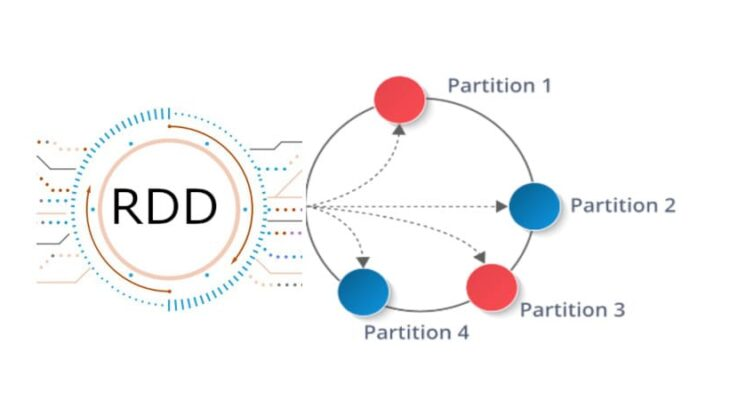

#### Features of an RDD in Spark:
- Resilience: RDDs track data lineage information to recover lost data, automatically on failure. It is also called fault tolerance.
- Distributed: Data present in an RDD resides on multiple nodes. It is distributed across different nodes of a cluster.
- Lazy evaluation: Data does not get loaded in an RDD even if you define it. Transformations are actually computed when you call action, such as count or collect, or save the output to a file system.
- Immutability: Data stored in an RDD is in the read-only mode━you cannot edit the data which is present in the RDD. But, you can create new RDDs by performing transformations on the existing RDDs.
- In-memory computation: An RDD stores any immediate data that is generated in the memory (RAM) than on the disk so that it provides faster access.
- Partitioning: Partitions can be done on any existing RDD to create logical parts that are mutable. You can achieve this by applying transformations to the existing partitions.


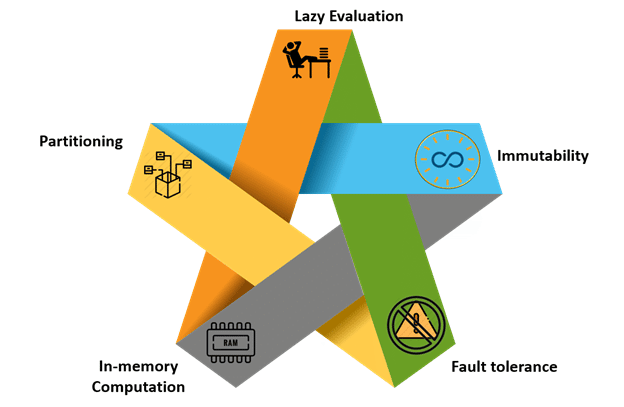

#### Operations on RDDs:
 1. Transformation
    - Functions that are used to transform data are called transformations.
    - It takes it as input and generates one or more as output.
    - Every time it creates new when we apply any transformation.
    - All the input, cannot be changed since these are immutable.
    - Produces a DAG which keeps track of which it was made when in the Life cycle.
    - Example : map(), filter(), Reduce(), intersection(), distinct(), groupByKey(), union(), mapPartitions(), flatMap(). 
 2. Action
    - Functions that are used to collect the distributed transformed results and create non-distributed data are called Actions.
    - Actions are a means of sending data from Executor to the Driver where the Executors are responsible for executing a task. At the same time, the Driver is a JVM process that manages workers and execution of the task.
    - Some Examples include : count(), collect(), take(n), top(), count value(), reduce(), fold(), aggregate(), foreach()


#### RDD Lifecycle:
- Create RDD
- Tranform
- Actions
- Read/transform a log file, then save the result

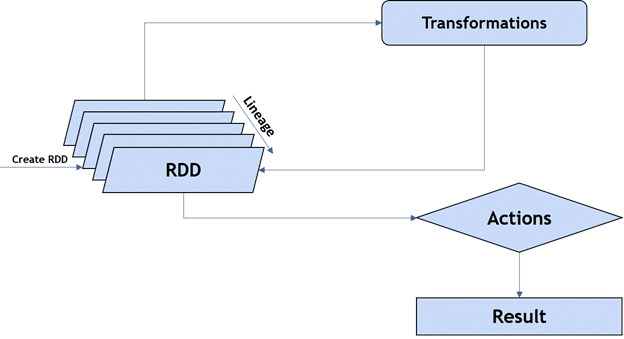

#### How to create RDD:
- There are two ways to create RDD:
  1.  Parallelizing an existing collection in your driver program
  2.  Referencing a dataset in an external storage system, such as a shared filesystem, HDFS, HBase, or any data source offering a Hadoop InputFormat

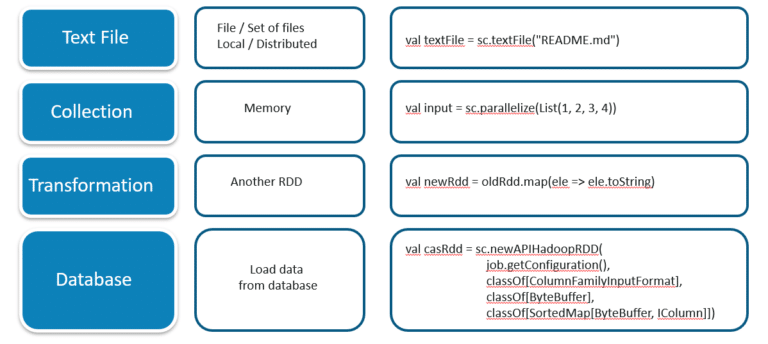

#### Linking with Spark:
 - Step_1 : Import the required spark classes into your Spark program.
    - SparkContex:A SparkContext represents the connection to a Spark cluster, and can be used to create RDDs, accumulators and broadcast variables on that cluster.
    - SparkConf:Configuration for a Spark application. Used to set various Spark parameters as key-value pairs.
 - Step_2 : Create a SparkContext object.
    - It tells Spark how to access a cluster.
    - Once you start the pyspark shell SparkSession creates default sc. 
    - To create a SparkContext you first need to stop the SparkContext,otherwise it will create value error:ValueError: Cannot run multiple SparkContexts at once; existing SparkContext(app=first_spark_app, master=local) created by __init__ at /var/folders/jh/0vc4j76j79g_1kb570k87_4h0000gn/T/ipykernel_1607/354901005.py:5 
    - To create it you need to build a SparkConf object that contains information about your application.

In [3]:
import pyspark
from pyspark import SparkContext, SparkConf
from pyspark.sql import *

conf=SparkConf()
sc=SparkContext(conf=conf)


# Stop default sc
sc.stop()
conf=SparkConf().setAppName("SparkRDDDemo").setMaster("spark://Kirtis-MBP.attlocal.net:7077")
sc=SparkContext(conf=conf)
## Create Spark Session
spark = SparkSession \
    .builder \
    .master("spark://Kirtis-MBP.attlocal.net:7077") \
    .appName("SparkRDDDemo") \
    .config("spark.executor.memory",'2g') \
    .getOrCreate()


Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


23/01/06 10:02:58 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [4]:
spark

In [4]:
print(sc)

<SparkContext master=spark://Kirtis-MBP.attlocal.net:7077 appName=SparkRDDDemo>


In [37]:
sc.accumulator

<bound method SparkContext.accumulator of <SparkContext master=spark://Kirtis-MBP.attlocal.net:7077 appName=SparkRDDDemo>>

In [38]:
sc.defaultMinPartitions

2

In [39]:
sc.defaultParallelism

6

In [5]:
print(sc.appName)

SparkRDDDemo


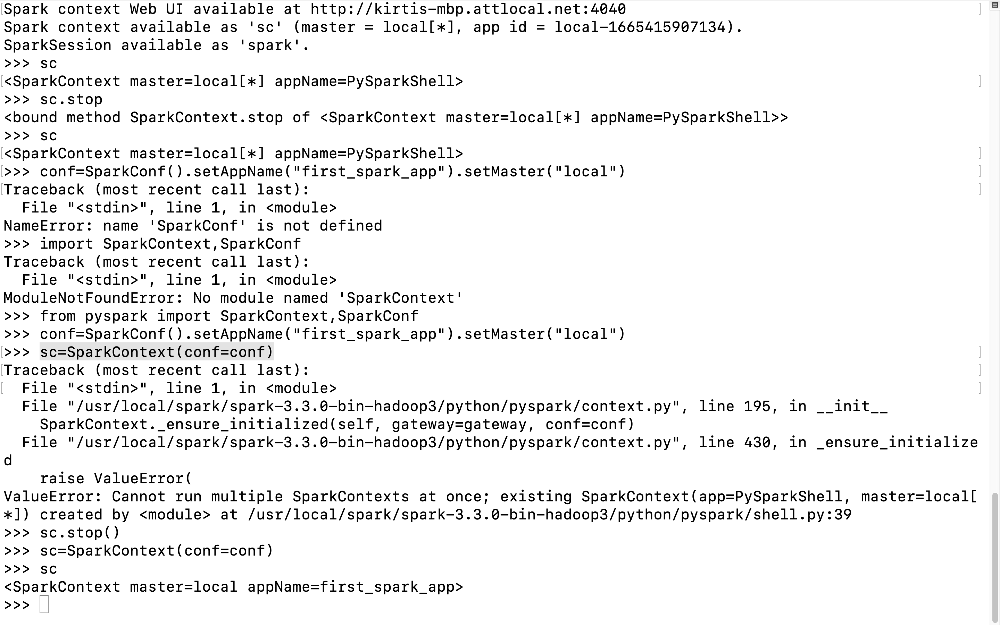

#### Using the Shell:
- In the PySpark shell, a special interpreter-aware SparkContext is already created for you, in the variable called sc. Making your own SparkContext will not work. 
- You can set which master the context connects to using the --master argument, and you can add Python .zip, .egg or .py files to the runtime path by passing a comma-separated list to --py-files.
-  ./bin/pyspark --master local[4]

#### Creating RDD:
1. Parallelizing an existing collection in your driver program
   - data = [1, 2, 3, 4, 5]
   - distData = sc.parallelize(data)
     - SparkSession available as 'spark'.
-  sc
- <SparkContext master=spark://Kirtis-MacBook-Pro.local:7077 appName=PySparkShell>
-  fruits=["apple","orange","pear","strawberry"]
-  fruitRdd=sc.parallelize(fruits)
-  fruitRdd.collect()
['apple', 'orange', 'pear', 'strawberry']                                       
-  fruitRdd.first()
'apple'                                                                          


In [7]:
#Create Parallelize RDD
days=["Sunday","Monday","Tuesday","Wednesday","Thursday","Friday","Saturday"]
dayRDD=sc.parallelize(days)
dayRDD.collect()

['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

In [8]:
data=[1,2,3,4,5]
dataRDD=sc.parallelize(data)
dataRDD.collect()

[1, 2, 3, 4, 5]

In [52]:
dataRDD.map(lambda x:x*x).collect()

[1, 4, 9, 16, 25]

In [53]:
dataRDD.filter(lambda x:x%2==0).collect()

[2, 4]

In [54]:
dataRDD.filter(lambda x:x%2!=0).collect()

[1, 3, 5]

In [55]:
dataRDD.reduce(lambda x,y:(x+y))

15

In [56]:
dataRDD.reduce(lambda x,y:(x*y))

120

In [58]:
dataRDD.flatMap(lambda x:[x,x+2,x+4]).collect()

[1, 3, 5, 2, 4, 6, 3, 5, 7, 4, 6, 8, 5, 7, 9]

#### RDD Operations
1. Transformation
   - **map(func)**:	Return a new distributed dataset formed by passing each element of the source through a function func.
   - **filter(func)**:	Return a new dataset formed by selecting those elements of the source on which func returns true.
   - **flatMap(func)**:	 Similar to map, but each input item can be mapped to 0 or more output items (so func should return a Seq rather than a single item).
   - **mapPartitions(func)**:	Similar to map, but runs separately on each partition (block) of the RDD, so func must be of type Iterator(T) => Iterator(U) when running on an RDD of type T.
   - **mapPartitionsWithIndex(func)**:	Similar to mapPartitions, but also provides func with an integer value representing the index of the partition, so func must be of type (Int, Iterator(T)) => Iterator(U) when running on an RDD of type T.
   - **sample(withReplacement, fraction, seed)**:	Sample a fraction fraction of the data, with or without replacement, using a given random number generator seed.
   - **union(otherDataset)**:	Return a new dataset that contains the union of the elements in the source dataset and the argument.
   - **intersection(otherDataset)**	 : Return a new RDD that contains the intersection of elements in the source dataset and the argument.
   - **distinct([numPartitions])**	 : Return a new dataset that contains the distinct elements of the source dataset.
   - **groupByKey([numPartitions])**:	When called on a dataset of (K, V) pairs, returns a dataset of (K, Iterable(V)) pairs.
   - **reduceByKey(func, [numPartitions])**	: When called on a dataset of (K, V) pairs, returns a dataset of (K, V) pairs where the values for each key are aggregated using the given reduce function func, which must be of type (V,V) => V. Like in groupByKey, the number of reduce tasks is configurable through an optional second argument.
   - **aggregateByKey(zeroValue)(seqOp, combOp, [numPartitions])**:	When called on a dataset of (K, V) pairs, returns a dataset of (K, U) pairs where the values for each key are aggregated using the given combine functions and a neutral "zero" value. Allows an aggregated value type that is different than the input value type, while avoiding unnecessary allocations. Like in groupByKey, the number of reduce tasks is configurable through an optional second argument.
   - **sortByKey([ascending], [numPartitions])**:	When called on a dataset of (K, V) pairs where K implements Ordered, returns a dataset of (K, V) pairs sorted by keys in ascending or descending order, as specified in the boolean ascending argument.
   - **join(otherDataset, [numPartitions])**:	When called on datasets of type (K, V) and (K, W), returns a dataset of (K, (V, W)) pairs with all pairs of elements for each key. Outer joins are supported through leftOuterJoin, rightOuterJoin, and fullOuterJoin.
   - **cogroup(otherDataset, [numPartitions])**	: When called on datasets of type (K, V) and (K, W), returns a dataset of (K, (Iterable<(V), Iterable(W))) tuples. This operation is also called groupWith.
   - **cartesian(otherDataset)**:	When called on datasets of types T and U, returns a dataset of (T, U) pairs (all pairs of elements).
   - **pipe(command, [envVars])**:	Pipe each partition of the RDD through a shell command, e.g. a Perl or bash script. RDD elements are written to the process's stdin and lines output to its stdout are returned as an RDD of strings.
   - **coalesce(numPartitions)**:	Decrease the number of partitions in the RDD to numPartitions. Useful for running operations more efficiently after filtering down a large dataset.
   - **repartition(numPartitions)**:	Reshuffle the data in the RDD randomly to create either more or fewer partitions and balance it across them. This always shuffles all data over the network.
   - **repartitionAndSortWithinPartitions(partitioner)**:	Repartition the RDD according to the given partitioner and, within each resulting partition, sort records by their keys. This is more efficient than calling repartition and then sorting within each partition because it can push the sorting down into the shuffle machinery.

   
2. Actions
   - **reduce(func)**:	Aggregate the elements of the dataset using a function func (which takes two arguments and returns one). The function should be commutative and associative so that it can be computed correctly in parallel.
   - **collect()** :	Return all the elements of the dataset as an array at the driver program. This is usually useful after a filter or other operation that returns a sufficiently small subset of the data.
   - **count()**:	Return the number of elements in the dataset.
   - **first()**:	Return the first element of the dataset (similar to take(1)).
   - **take(n)**:	Return an array with the first n elements of the dataset.
   - **takeSample(withReplacement, num, [seed])**:	Return an array with a random sample of num elements of the dataset, with or without replacement, optionally pre-specifying a random number generator seed.
   - **takeOrdered(n, [ordering])**	: Return the first n elements of the RDD using either their natural order or a custom comparator.
   - **saveAsTextFile(path)** :	Write the elements of the dataset as a text file (or set of text files) in a given directory in the local filesystem, HDFS or any other Hadoop-supported file system. Spark will call toString on each element to convert it to a line of text in the file.
   - **saveAsSequenceFile(path)**: (Java and Scala)	Write the elements of the dataset as a Hadoop SequenceFile in a given path in the local filesystem, HDFS or any other Hadoop-supported file system. This is available on RDDs of key-value pairs that implement Hadoop's Writable interface. In Scala, it is also available on types that are implicitly convertible to Writable (Spark includes conversions for basic types like Int, Double, String, etc).
   - **saveAsObjectFile(path)** : (Java and Scala)	Write the elements of the dataset in a simple format using Java serialization, which can then be loaded using SparkContext.objectFile().
   - **countByKey()** :	Only available on RDDs of type (K, V). Returns a hashmap of (K, Int) pairs with the count of each key.
   - **foreach(func)**:	Run a function func on each element of the dataset. This is usually done for side effects such as updating an Accumulator or interacting with external storage systems.

   

In [9]:
#take(n) to display n number of data
dayRDD.take(5)

['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday']

In [10]:
#filter is transformation to filter the data and collect is action.
dayRDD.filter(lambda x:x.startswith("S")).collect()

['Sunday', 'Saturday']

In [11]:
dayRDD.map(lambda x:x.lower()).collect()

['sunday', 'monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday']

In [59]:
dayRDD.flatMap(lambda x:x).collect()

['S',
 'u',
 'n',
 'd',
 'a',
 'y',
 'M',
 'o',
 'n',
 'd',
 'a',
 'y',
 'T',
 'u',
 'e',
 's',
 'd',
 'a',
 'y',
 'W',
 'e',
 'd',
 'n',
 'e',
 's',
 'd',
 'a',
 'y',
 'T',
 'h',
 'u',
 'r',
 's',
 'd',
 'a',
 'y',
 'F',
 'r',
 'i',
 'd',
 'a',
 'y',
 'S',
 'a',
 't',
 'u',
 'r',
 'd',
 'a',
 'y']

In [13]:
#Loading file
f=sc.textFile("/Users/kirtikamerkar/austincapitaldata/spark-labs-python/data/twinkle/sample.txt")
f.collect()

['twinkle twinkle little star',
 'how I wonder what you are',
 'up above the world so high',
 'like a diamond in the sky',
 'twinkle twinkle little star']

In [14]:
fJson=sc.textFile("/Users/kirtikamerkar/austincapitaldata/spark-labs-python/data/voters-timed-5K.json")

In [17]:
fJson.take(10)

['{"gender":"F","age":33,"party":"D","timestamp":"2021-03-11T15:47:14Z"}',
 '{"gender":"F","age":96,"party":"R","timestamp":"2021-03-11T15:46:14Z"}',
 '{"gender":"M","age":26,"party":"D","timestamp":"2021-03-11T15:44:53Z"}',
 '{"gender":"F","age":66,"party":"D","timestamp":"2021-03-11T15:47:33Z"}',
 '{"gender":"M","age":60,"party":"R","timestamp":"2021-03-11T15:43:37Z"}',
 '{"gender":"F","age":54,"party":"R","timestamp":"2021-03-11T15:44:09Z"}',
 '{"gender":"M","age":47,"party":"R","timestamp":"2021-03-11T15:47:48Z"}',
 '{"gender":"M","age":29,"party":"R","timestamp":"2021-03-11T15:46:53Z"}',
 '{"gender":"M","age":30,"party":"D","timestamp":"2021-03-11T15:47:53Z"}',
 '{"gender":"F","age":67,"party":"D","timestamp":"2021-03-11T15:44:03Z"}']

In [18]:
fJson.first()

'{"gender":"F","age":33,"party":"D","timestamp":"2021-03-11T15:47:14Z"}'

In [25]:
fJson.getNumPartitions()

2

In [23]:
voterDF=spark.read.json("/Users/kirtikamerkar/austincapitaldata/spark-labs-python/data/voters-timed-5K.json")

In [26]:
voterDF.rdd.getNumPartitions()

1

###### repartition() can be used for increasing or decreasing the number of partitions of a Spark DataFrame.However, repartition() involves shuffling which is a costly operation.

###### On the other hand, coalesce() can be used when we want to reduce the number of partitions as this is more efficient due to the fact that this method won’t trigger data shuffling across the nodes of the Spark Cluster.

In [40]:
voterDf=voterDF.repartition(5)


In [33]:
voterDF.show()

+---+------+-----+--------------------+
|age|gender|party|           timestamp|
+---+------+-----+--------------------+
| 33|     F|    D|2021-03-11T15:47:14Z|
| 96|     F|    R|2021-03-11T15:46:14Z|
| 26|     M|    D|2021-03-11T15:44:53Z|
| 66|     F|    D|2021-03-11T15:47:33Z|
| 60|     M|    R|2021-03-11T15:43:37Z|
| 54|     F|    R|2021-03-11T15:44:09Z|
| 47|     M|    R|2021-03-11T15:47:48Z|
| 29|     M|    R|2021-03-11T15:46:53Z|
| 30|     M|    D|2021-03-11T15:47:53Z|
| 67|     F|    D|2021-03-11T15:44:03Z|
| 67|     F|    D|2021-03-11T15:44:30Z|
| 29|     M|    D|2021-03-11T15:46:47Z|
| 92|     F|    D|2021-03-11T15:44:25Z|
| 59|     M|    D|2021-03-11T15:44:30Z|
| 58|     F|    D|2021-03-11T15:45:47Z|
| 55|     F|    R|2021-03-11T15:45:39Z|
| 49|     M|    R|2021-03-11T15:47:39Z|
| 37|     F|    D|2021-03-11T15:46:55Z|
| 90|     F|    R|2021-03-11T15:44:32Z|
| 98|     F|    R|2021-03-11T15:43:49Z|
+---+------+-----+--------------------+
only showing top 20 rows



In [41]:
voterDf.rdd.getNumPartitions()

5

In [42]:
voterDf.show()

+---+------+-----+--------------------+
|age|gender|party|           timestamp|
+---+------+-----+--------------------+
| 29|     F|    D|2021-03-11T16:02:06Z|
| 36|     M|    D|2021-03-11T15:50:21Z|
| 50|     M|    D|2021-03-11T15:45:43Z|
| 53|     F|    D|2021-03-11T16:01:33Z|
| 85|     M|    D|2021-03-11T15:47:03Z|
| 57|     F|    R|2021-03-11T15:59:01Z|
| 38|     F|    D|2021-03-11T15:48:01Z|
| 92|     F|    R|2021-03-11T15:59:54Z|
| 98|     F|    D|2021-03-11T15:59:08Z|
| 42|     M|    R|2021-03-11T15:51:03Z|
| 23|     M|    R|2021-03-11T15:45:22Z|
| 82|     M|    D|2021-03-11T15:51:24Z|
| 58|     F|    R|2021-03-11T15:43:12Z|
| 56|     F|    R|2021-03-11T16:03:08Z|
| 43|     M|    D|2021-03-11T15:50:50Z|
| 90|     F|    D|2021-03-11T15:49:38Z|
| 70|     M|    D|2021-03-11T15:57:16Z|
| 34|     M|    D|2021-03-11T16:01:49Z|
| 60|     F|    D|2021-03-11T15:54:59Z|
| 38|     M|    D|2021-03-11T15:54:11Z|
+---+------+-----+--------------------+
only showing top 20 rows



In [21]:
voterDF=spark.read.json(fJson)

In [22]:
voterDF.show(5)

+---+------+-----+--------------------+
|age|gender|party|           timestamp|
+---+------+-----+--------------------+
| 33|     F|    D|2021-03-11T15:47:14Z|
| 96|     F|    R|2021-03-11T15:46:14Z|
| 26|     M|    D|2021-03-11T15:44:53Z|
| 66|     F|    D|2021-03-11T15:47:33Z|
| 60|     M|    R|2021-03-11T15:43:37Z|
+---+------+-----+--------------------+
only showing top 5 rows



In [48]:
voterDF.filter((voterDF.gender=="F") & (voterDF.age>=50)).show(10)

+---+------+-----+--------------------+
|age|gender|party|           timestamp|
+---+------+-----+--------------------+
| 96|     F|    R|2021-03-11T15:46:14Z|
| 66|     F|    D|2021-03-11T15:47:33Z|
| 54|     F|    R|2021-03-11T15:44:09Z|
| 67|     F|    D|2021-03-11T15:44:03Z|
| 67|     F|    D|2021-03-11T15:44:30Z|
| 92|     F|    D|2021-03-11T15:44:25Z|
| 58|     F|    D|2021-03-11T15:45:47Z|
| 55|     F|    R|2021-03-11T15:45:39Z|
| 90|     F|    R|2021-03-11T15:44:32Z|
| 98|     F|    R|2021-03-11T15:43:49Z|
+---+------+-----+--------------------+
only showing top 10 rows



In [49]:
voterDF.filter((voterDF.gender=="F") & (voterDF.age>=50)).count()

1544

#### Limitations of RDD:
- Low level API
- Opaque to Spark engine(uses arbitrary lambda)
- No support for SQL like querying

#### References:
- https://www.analyticsvidhya.com/blog/2021/08/understand-the-internal-working-of-apache-spark/
- https://proedu.co/spark/how-to-create-rdd-in-apache-spark-in-different-ways/
- https://docs.oracle.com/en/java/javase/14/docs/specs/man/jps.html#:~:text=The%20jps%20command%20uses%20the,main%20method%20aren't%20available.
- https://www.oreilly.com/library/view/data-algorithms-with/9781492082378/ch01.htmlcd
- https://www.roseindia.net/bigdata/pyspark/pyspark-line-45-python-command-not-found.shtml
- https://medium.com/expedia-group-tech/part-3-efficient-executor-configuration-for-apache-spark-b4602929262
- https://opensource.com/article/18/11/pyspark-jupyter-notebook
- https://pages.databricks.com/rs/094-YMS-629/images/LearningSpark2.0.pdf